# Drought Analysis: Detecting Vegetation Stress from Space

In this notebook, we'll compare satellite imagery from a **normal year** vs a **drought year** to see how drought affects vegetation.

**What we'll discover:**
1. NDVI reveals vegetation stress invisible to the casual observer
2. Agricultural areas show dramatic differences between wet and dry years
3. We can quantify drought impact across large regions

**Why this matters:**
- Farmers need early warning of crop stress
- Water managers allocate resources based on drought severity
- Insurance companies assess agricultural losses
- Climate researchers track long-term drought patterns

---
## 1. Setup

In [1]:
from pystac_client import Client
import planetary_computer as pc
from odc.stac import stac_load

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
print("Connected to Planetary Computer")

Connected to Planetary Computer


---
## 2. Understanding Drought Detection with NDVI

**How drought affects vegetation:**
- Water-stressed plants close their stomata (pores) to conserve water
- This reduces photosynthesis → less chlorophyll activity
- Less chlorophyll → plants absorb less red light
- Stressed cell structure → plants reflect less NIR
- Result: **Lower NDVI** in drought conditions

**Key insight:** Two fields might look similarly "brown" in true color during summer, but NDVI reveals which one is drought-stressed vs just naturally dry.

| NDVI Range | In Normal Year | In Drought Year |
|------------|----------------|------------------|
| 0.6 - 0.8 | Healthy irrigated crops | Stressed but surviving |
| 0.3 - 0.6 | Moderate vegetation | Severely stressed |
| 0.1 - 0.3 | Sparse/dry grass | Dead or dormant |
| < 0.1 | Bare soil | Bare soil (same) |

---
## 3. Select a Drought Event

We'll analyze the **California Drought** by comparing:
- **2019** — A relatively normal/wet year
- **2021** — Severe drought year (one of the driest on record)

**Location:** California's Central Valley — one of the most productive agricultural regions in the world, heavily dependent on irrigation and rainfall.

**Why summer?** Drought stress is most visible in July-August when water demand peaks.

In [2]:
# California Central Valley - Agricultural region near Fresno
event_name = "California Drought Comparison"
bbox = [-120.10, 36.60, -119.80, 36.85]  # Central Valley agricultural area

# Time periods - same season, different years
normal_year_date = "2019-07-15/2019-08-15"   # Normal/wet year
drought_year_date = "2021-07-15/2021-08-15"  # Severe drought year

print(f"Analysis: {event_name}")
print(f"Location: Central Valley, California (agricultural region)")
print(f"Normal year:  {normal_year_date}")
print(f"Drought year: {drought_year_date}")

Analysis: California Drought Comparison
Location: Central Valley, California (agricultural region)
Normal year:  2019-07-15/2019-08-15
Drought year: 2021-07-15/2021-08-15


---
## 4. Helper Functions

In [3]:
def normalize_for_display(img, pmin=2, pmax=98):
    """Normalize image to 0-1 range for display."""
    lo, hi = np.nanpercentile(img, [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-6), 0, 1)

def compute_ndvi(nir, red):
    """Compute Normalized Difference Vegetation Index: (NIR - Red) / (NIR + Red)"""
    nir = nir.astype('float32')
    red = red.astype('float32')
    return (nir - red) / (nir + red + 1e-6)

def compute_ndwi(green, nir):
    """Compute Normalized Difference Water Index: (Green - NIR) / (Green + NIR)"""
    green = green.astype('float32')
    nir = nir.astype('float32')
    return (green - nir) / (green + nir + 1e-6)

def load_image(catalog, bbox, date_range, max_cloud=15):
    """Load a Sentinel-2 image for the given location and date range."""
    search = catalog.search(
        collections=["sentinel-2-l2a"],
        bbox=bbox,
        datetime=date_range,
        query={"eo:cloud_cover": {"lt": max_cloud}},
    )
    items = list(search.items())
    
    if len(items) == 0:
        print(f"  No images with <{max_cloud}% clouds. Trying with <30% clouds...")
        search = catalog.search(
            collections=["sentinel-2-l2a"],
            bbox=bbox,
            datetime=date_range,
            query={"eo:cloud_cover": {"lt": 30}},
        )
        items = list(search.items())
    
    if len(items) == 0:
        raise ValueError(f"No images found for {date_range}")
    
    # Get clearest image
    items_sorted = sorted(items, key=lambda x: x.properties.get('eo:cloud_cover', 100))
    item = items_sorted[0]
    
    signed_item = pc.sign(item)
    data = stac_load(
        [signed_item],
        bands=["B02", "B03", "B04", "B08"],  # Blue, Green, Red, NIR
        bbox=bbox,
        crs="EPSG:4326",
        resolution=0.0002,
        groupby="solar_day",
    )
    
    return data, item

print("Helper functions defined.")

Helper functions defined.


---
## 5. Load Images from Both Years

In [4]:
print("Loading NORMAL year image (2019)...")
normal_data, normal_item = load_image(catalog, bbox, normal_year_date)
print(f"  Date: {normal_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {normal_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(normal_data.dims)}")

print("\nLoading DROUGHT year image (2021)...")
drought_data, drought_item = load_image(catalog, bbox, drought_year_date)
print(f"  Date: {drought_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {drought_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(drought_data.dims)}")

Loading NORMAL year image (2019)...
  Date: 2019-07-31
  Cloud cover: 0.1%
  Data dimensions: {'latitude': 1250, 'longitude': 1500, 'time': 1}

Loading DROUGHT year image (2021)...
  Date: 2021-08-09
  Cloud cover: 0.1%
  Data dimensions: {'latitude': 1250, 'longitude': 1500, 'time': 1}


---
## 6. Extract Bands and Create Composites

In [5]:
# Extract bands for normal year
normal_red = normal_data["B04"].isel(time=0).values
normal_green = normal_data["B03"].isel(time=0).values
normal_blue = normal_data["B02"].isel(time=0).values
normal_nir = normal_data["B08"].isel(time=0).values

# Extract bands for drought year
drought_red = drought_data["B04"].isel(time=0).values
drought_green = drought_data["B03"].isel(time=0).values
drought_blue = drought_data["B02"].isel(time=0).values
drought_nir = drought_data["B08"].isel(time=0).values

# Create RGB composites
normal_rgb = normalize_for_display(np.stack([normal_red, normal_green, normal_blue], axis=-1))
drought_rgb = normalize_for_display(np.stack([drought_red, drought_green, drought_blue], axis=-1))

# Check the shape
print(f"Image shape: {normal_rgb.shape}")
img_height, img_width = normal_rgb.shape[:2]
aspect_ratio = img_width / img_height
print(f"  Aspect ratio (w/h): {aspect_ratio:.2f}")

Image shape: (1250, 1500, 3)
  Aspect ratio (w/h): 1.20


---
## 7. True Color Comparison

First, let's see if we can spot the drought in true color.

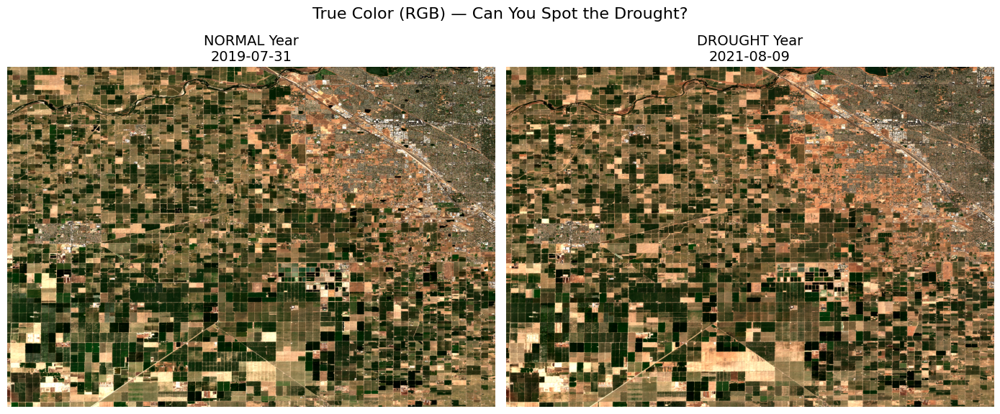

In [6]:
# Figure size based on image aspect ratio
img_height, img_width = normal_rgb.shape[:2]
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

axes[0].imshow(normal_rgb, aspect='auto')
axes[0].set_title(f"NORMAL Year\n{normal_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[0].axis('off')

axes[1].imshow(drought_rgb, aspect='auto')
axes[1].set_title(f"DROUGHT Year\n{drought_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[1].axis('off')

plt.suptitle("True Color (RGB) — Can You Spot the Drought?", fontsize=16)
plt.tight_layout()
plt.show()

### What can you see in true color?

In California's Central Valley during summer:
- Both years might look somewhat similar — brown/tan agricultural land
- Irrigated fields may still appear green in both
- The difference is subtle to the human eye

**But NDVI will reveal the hidden stress...**

---
## 8. Compute NDVI (Vegetation Health)

In [7]:
# Compute NDVI for both years
normal_ndvi = compute_ndvi(normal_nir, normal_red)
drought_ndvi = compute_ndvi(drought_nir, drought_red)

print(f"Normal Year NDVI:  min={np.nanmin(normal_ndvi):.2f}, max={np.nanmax(normal_ndvi):.2f}, mean={np.nanmean(normal_ndvi):.2f}")
print(f"Drought Year NDVI: min={np.nanmin(drought_ndvi):.2f}, max={np.nanmax(drought_ndvi):.2f}, mean={np.nanmean(drought_ndvi):.2f}")

# Calculate the drop in mean NDVI
ndvi_drop = np.nanmean(normal_ndvi) - np.nanmean(drought_ndvi)
ndvi_drop_pct = 100 * ndvi_drop / np.nanmean(normal_ndvi)
print(f"\nDrop in mean NDVI: {ndvi_drop:.3f} ({ndvi_drop_pct:.1f}% reduction)")

Normal Year NDVI:  min=-1.00, max=1.00, mean=0.44
Drought Year NDVI: min=-0.99, max=1.00, mean=0.41

Drop in mean NDVI: 0.028 (6.3% reduction)


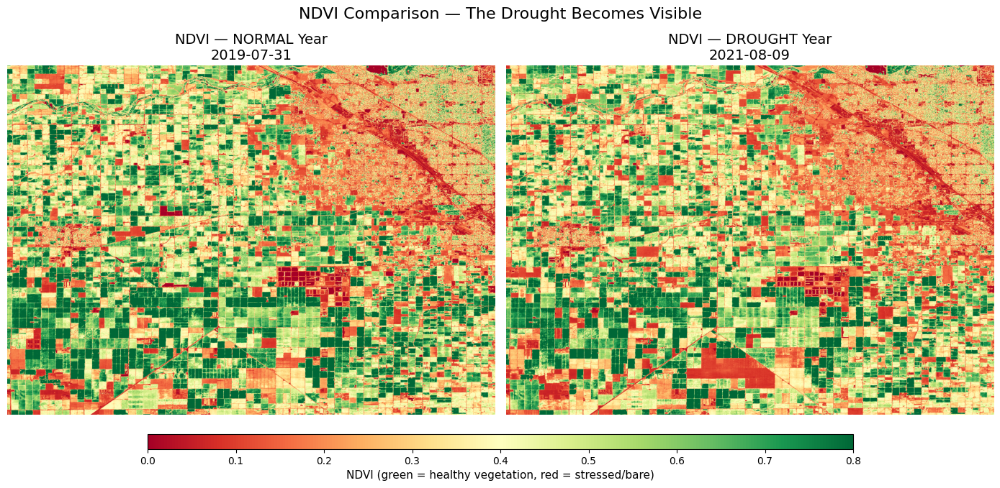

In [8]:
# Figure size based on aspect ratio
img_height, img_width = normal_ndvi.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height + 1))

im0 = axes[0].imshow(normal_ndvi, cmap='RdYlGn', vmin=0, vmax=0.8, aspect='auto')
axes[0].set_title(f"NDVI — NORMAL Year\n{normal_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[0].axis('off')

im1 = axes[1].imshow(drought_ndvi, cmap='RdYlGn', vmin=0, vmax=0.8, aspect='auto')
axes[1].set_title(f"NDVI — DROUGHT Year\n{drought_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[1].axis('off')

plt.suptitle("NDVI Comparison — The Drought Becomes Visible", fontsize=16)
plt.tight_layout()

cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.03])
cbar = fig.colorbar(im1, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NDVI (green = healthy vegetation, red = stressed/bare)', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

### What NDVI reveals:

Now the drought impact is clear:
- **Normal year:** More green pixels — healthy, well-watered vegetation
- **Drought year:** More yellow/red pixels — stressed, water-starved vegetation
- **Same fields, same season** — but dramatically different health

---
## 9. Compute Drought Impact (dNDVI)

Let's quantify the change:

$$dNDVI = NDVI_{normal} - NDVI_{drought}$$

**Interpretation:**
- **High positive dNDVI:** Vegetation much healthier in normal year → severe drought impact
- **Near zero:** Similar vegetation health in both years
- **Negative dNDVI:** Vegetation actually healthier in drought year (rare, usually irrigated areas)

In [9]:
# Compute dNDVI (change in vegetation health)
dndvi = normal_ndvi - drought_ndvi

print(f"dNDVI statistics:")
print(f"  Min: {np.nanmin(dndvi):.2f}")
print(f"  Max: {np.nanmax(dndvi):.2f}")
print(f"  Mean: {np.nanmean(dndvi):.2f}")

# Count significantly impacted pixels
stressed_pixels = np.sum(dndvi > 0.1)  # Threshold for "drought stressed"
severely_stressed = np.sum(dndvi > 0.2)  # Severe stress
total_pixels = dndvi.size
print(f"\nDrought Impact:")
print(f"  Moderately stressed (dNDVI > 0.1): {100 * stressed_pixels / total_pixels:.1f}% of area")
print(f"  Severely stressed (dNDVI > 0.2):   {100 * severely_stressed / total_pixels:.1f}% of area")

dNDVI statistics:
  Min: -1.74
  Max: 1.56
  Mean: 0.03

Drought Impact:
  Moderately stressed (dNDVI > 0.1): 21.2% of area
  Severely stressed (dNDVI > 0.2):   9.9% of area


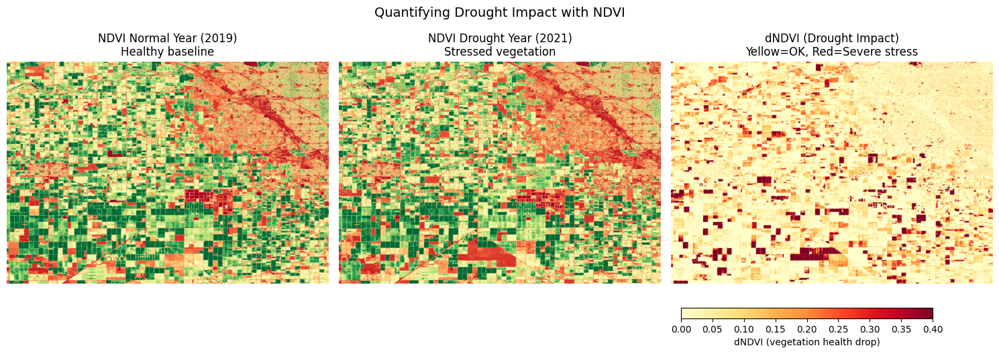

In [10]:
# Figure size for 3 subplots
img_height, img_width = dndvi.shape
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 3, figsize=(subplot_width * 3, subplot_height + 1))

# Normal year NDVI
im0 = axes[0].imshow(normal_ndvi, cmap='RdYlGn', vmin=0, vmax=0.8, aspect='auto')
axes[0].set_title(f"NDVI Normal Year ({normal_item.datetime.year})\nHealthy baseline", fontsize=12)
axes[0].axis('off')

# Drought year NDVI
im1 = axes[1].imshow(drought_ndvi, cmap='RdYlGn', vmin=0, vmax=0.8, aspect='auto')
axes[1].set_title(f"NDVI Drought Year ({drought_item.datetime.year})\nStressed vegetation", fontsize=12)
axes[1].axis('off')

# dNDVI - drought impact
im2 = axes[2].imshow(dndvi, cmap='YlOrRd', vmin=0, vmax=0.4, aspect='auto')
axes[2].set_title("dNDVI (Drought Impact)\nYellow=OK, Red=Severe stress", fontsize=12)
axes[2].axis('off')

plt.suptitle("Quantifying Drought Impact with NDVI", fontsize=14)
plt.tight_layout()

cbar_ax = fig.add_axes([0.68, 0.08, 0.25, 0.03])
cbar = fig.colorbar(im2, cax=cbar_ax, orientation='horizontal')
cbar.set_label('dNDVI (vegetation health drop)', fontsize=10)
plt.subplots_adjust(bottom=0.18)
plt.show()

---
## 10. Classify Drought Severity

In [11]:
def classify_drought_impact(dndvi, drought_ndvi):
    """
    Classify drought impact based on NDVI change and current state.
    Returns integer classes:
    0 = No impact (stable or improved)
    1 = Mild stress (slight NDVI drop)
    2 = Moderate stress (noticeable NDVI drop)
    3 = Severe stress (major NDVI drop)
    4 = Critical (vegetation likely dead/fallow)
    """
    impact = np.zeros_like(dndvi, dtype=np.int8)
    
    # No impact or improved
    impact[dndvi <= 0.05] = 0
    
    # Mild stress
    impact[(dndvi > 0.05) & (dndvi <= 0.15)] = 1
    
    # Moderate stress
    impact[(dndvi > 0.15) & (dndvi <= 0.25)] = 2
    
    # Severe stress
    impact[(dndvi > 0.25) & (dndvi <= 0.40)] = 3
    
    # Critical - major drop AND very low current NDVI
    impact[(dndvi > 0.40) | ((dndvi > 0.25) & (drought_ndvi < 0.15))] = 4
    
    return impact

drought_map = classify_drought_impact(dndvi, drought_ndvi)

# Count pixels in each class
print("Drought Impact Classification:")
print("-" * 50)
impact_names = ['No Impact', 'Mild Stress', 'Moderate Stress', 'Severe Stress', 'Critical']
for i, name in enumerate(impact_names):
    count = np.sum(drought_map == i)
    pct = 100 * count / drought_map.size
    print(f"  {name:17s}: {pct:5.1f}% of area")

Drought Impact Classification:
--------------------------------------------------
  No Impact        :  64.6% of area
  Mild Stress      :  21.5% of area
  Moderate Stress  :   6.4% of area
  Severe Stress    :   2.1% of area
  Critical         :   5.3% of area


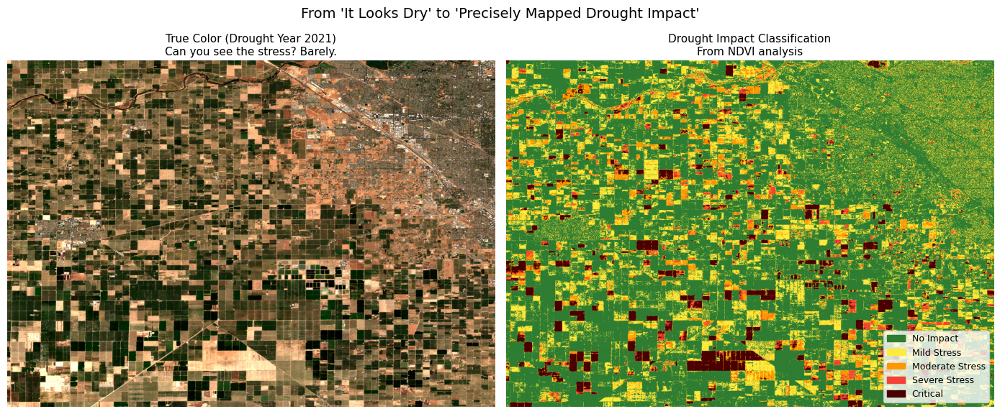

In [12]:
# Create a custom colormap for drought classes
colors = ['#2E7D32', '#FFEB3B', '#FF9800', '#F44336', '#4A0000']  # Green to dark red
cmap_drought = ListedColormap(colors)
bounds = [-0.5, 0.5, 1.5, 2.5, 3.5, 4.5]
norm = BoundaryNorm(bounds, cmap_drought.N)

# Figure size based on aspect ratio
img_height, img_width = drought_map.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

# True color drought year
axes[0].imshow(drought_rgb, aspect='auto')
axes[0].set_title(f"True Color (Drought Year {drought_item.datetime.year})\nCan you see the stress? Barely.", fontsize=11)
axes[0].axis('off')

# Classified drought map
im = axes[1].imshow(drought_map, cmap=cmap_drought, norm=norm, aspect='auto')
axes[1].set_title("Drought Impact Classification\nFrom NDVI analysis", fontsize=11)
axes[1].axis('off')

# Add legend
patches = [
    mpatches.Patch(color=colors[0], label='No Impact'),
    mpatches.Patch(color=colors[1], label='Mild Stress'),
    mpatches.Patch(color=colors[2], label='Moderate Stress'),
    mpatches.Patch(color=colors[3], label='Severe Stress'),
    mpatches.Patch(color=colors[4], label='Critical'),
]
axes[1].legend(handles=patches, loc='lower right', fontsize=9)

plt.suptitle("From 'It Looks Dry' to 'Precisely Mapped Drought Impact'", fontsize=14)
plt.tight_layout()
plt.show()

---
## 11. Drought Impact Report

In [13]:
# Calculate approximate areas
pixel_area_hectares = 0.04  # Approximate hectares per pixel at this resolution

print("="*60)
print("DROUGHT IMPACT REPORT")
print("="*60)
print(f"Analysis: {event_name}")
print(f"Normal year:  {normal_item.datetime.strftime('%Y-%m-%d')}")
print(f"Drought year: {drought_item.datetime.strftime('%Y-%m-%d')}")
print(f"Mean NDVI drop: {ndvi_drop:.3f} ({ndvi_drop_pct:.1f}% reduction)")
print("="*60)
print("\nDrought Severity Breakdown:")
print("-"*60)

actions = [
    "Normal conditions - no intervention needed",
    "Monitor - consider supplemental irrigation",
    "Warning - irrigation critical, possible yield loss",
    "ALERT - significant crop damage likely",
    "CRITICAL - crop failure, emergency response needed"
]

for i, name in enumerate(impact_names):
    count = np.sum(drought_map == i)
    pct = 100 * count / drought_map.size
    area = count * pixel_area_hectares
    
    print(f"\n{name}:")
    print(f"  Coverage: {pct:.1f}% (~{area:.0f} hectares)")
    print(f"  Action:   {actions[i]}")

print("\n" + "="*60)
print("This report was generated automatically from satellite data.")
print("NDVI comparison reveals drought stress invisible to the eye.")
print("="*60)

DROUGHT IMPACT REPORT
Analysis: California Drought Comparison
Normal year:  2019-07-31
Drought year: 2021-08-09
Mean NDVI drop: 0.028 (6.3% reduction)

Drought Severity Breakdown:
------------------------------------------------------------

No Impact:
  Coverage: 64.6% (~48487 hectares)
  Action:   Normal conditions - no intervention needed

Mild Stress:
  Coverage: 21.5% (~16140 hectares)
  Action:   Monitor - consider supplemental irrigation

Moderate Stress:
  Coverage: 6.4% (~4808 hectares)
  Action:   Warning - irrigation critical, possible yield loss

Severe Stress:
  Coverage: 2.1% (~1583 hectares)
  Action:   ALERT - significant crop damage likely

Critical:
  Coverage: 5.3% (~3983 hectares)
  Action:   CRITICAL - crop failure, emergency response needed

This report was generated automatically from satellite data.
NDVI comparison reveals drought stress invisible to the eye.


---
## 12. Full Comparison View

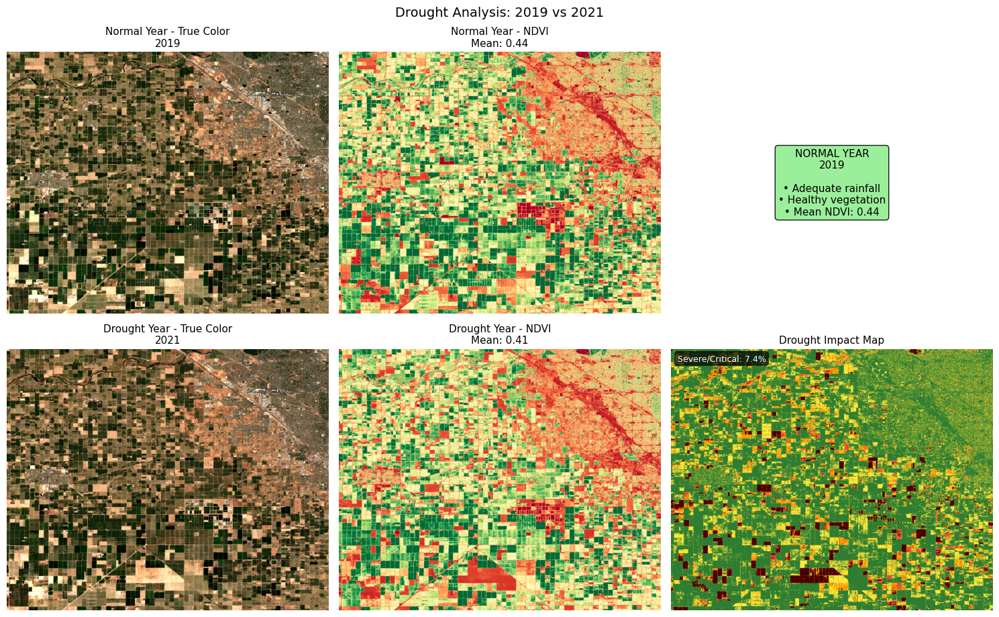

In [14]:
# Figure size for 2x3 grid based on image aspect ratio
img_height, img_width = normal_rgb.shape[:2]
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(2, 3, figsize=(subplot_width * 3, subplot_height * 2 + 1))

# Row 1: Normal Year
axes[0, 0].imshow(normal_rgb, aspect='auto')
axes[0, 0].set_title(f"Normal Year - True Color\n{normal_item.datetime.year}", fontsize=11)
axes[0, 0].axis('off')

im_norm = axes[0, 1].imshow(normal_ndvi, cmap='RdYlGn', vmin=0, vmax=0.8, aspect='auto')
axes[0, 1].set_title(f"Normal Year - NDVI\nMean: {np.nanmean(normal_ndvi):.2f}", fontsize=11)
axes[0, 1].axis('off')

axes[0, 2].axis('off')
axes[0, 2].text(0.5, 0.5, f"NORMAL YEAR\n{normal_item.datetime.year}\n\n• Adequate rainfall\n• Healthy vegetation\n• Mean NDVI: {np.nanmean(normal_ndvi):.2f}",
                transform=axes[0, 2].transAxes, fontsize=11, ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.9))

# Row 2: Drought Year
axes[1, 0].imshow(drought_rgb, aspect='auto')
axes[1, 0].set_title(f"Drought Year - True Color\n{drought_item.datetime.year}", fontsize=11)
axes[1, 0].axis('off')

im_drought = axes[1, 1].imshow(drought_ndvi, cmap='RdYlGn', vmin=0, vmax=0.8, aspect='auto')
axes[1, 1].set_title(f"Drought Year - NDVI\nMean: {np.nanmean(drought_ndvi):.2f}", fontsize=11)
axes[1, 1].axis('off')

axes[1, 2].imshow(drought_map, cmap=cmap_drought, norm=norm, aspect='auto')
axes[1, 2].set_title("Drought Impact Map", fontsize=11)
axes[1, 2].axis('off')
severe_pct = 100 * np.sum(drought_map >= 3) / drought_map.size
axes[1, 2].text(0.02, 0.98, f"Severe/Critical: {severe_pct:.1f}%", transform=axes[1, 2].transAxes,
                fontsize=9, va='top', color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

plt.suptitle(f"Drought Analysis: {normal_item.datetime.year} vs {drought_item.datetime.year}", fontsize=14)
plt.tight_layout()
plt.show()

---
## Summary: Drought Detection with NDVI

### What we learned:

| Metric | What it shows |
|--------|---------------|
| **NDVI** | Current vegetation health |
| **dNDVI** | Change from normal conditions |
| **Classification** | Actionable drought severity levels |

### Key insight:

Two summers might look similarly "brown" in true color, but NDVI reveals:
- Which fields are **normally dry** vs **drought-stressed**
- The **severity gradient** across the landscape
- **Quantifiable impact** for insurance, policy, and planning

### Real-world applications:

| Application | How NDVI drought analysis helps |
|-------------|----------------------------------|
| Agriculture | Early warning for irrigation decisions |
| Insurance | Objective crop loss assessment |
| Water management | Allocate resources to stressed regions |
| Policy | Declare drought emergencies with data |
| Climate research | Track drought frequency and severity over decades |